In [53]:
import numpy as np # linear algebra
import matplotlib.pyplot as plt
import pandas as pd
import plotly.express as px
from wordcloud import WordCloud
import warnings
warnings.filterwarnings('ignore')
import os

In [66]:
df = pd.read_csv("Airbnb_Open_Data.csv", low_memory=False)

In [67]:
print("df type:", type(df))
print("df shape:", df.shape)
df.head()

df type: <class 'pandas.core.frame.DataFrame'>
df shape: (102599, 26)


,id,NAME,host id,host_identity_verified,host name,neighbourhood group,neighbourhood,lat,long,country,...,service fee,minimum nights,number of reviews,last review,reviews per month,review rate number,calculated host listings count,availability 365,house_rules,license
0,1001254,Clean & quiet apt home by the park,80014485718,unconfirmed,Madaline,Brooklyn,Kensington,40.64749,-73.97237,United States,...,$193,10.0,9.0,10/19/2021,0.21,4.0,6.0,286.0,Clean up and treat the home the way you'd like...,NaN
1,1002102,Skylit Midtown Castle,52335172823,verified,Jenna,Manhattan,Midtown,40.75362,-73.98377,United States,...,$28,30.0,45.0,5/21/2022,0.38,4.0,2.0,228.0,Pet friendly but please confirm with me if the...,NaN
2,1002403,THE VILLAGE OF HARLEM....NEW YORK !,78829239556,NaN,Elise,Manhattan,Harlem,40.80902,-73.94190,United States,...,$124,3.0,0.0,NaN,NaN,5.0,1.0,352.0,"I encourage you to use my kitchen, cooking and...",NaN
3,1002755,NaN,85098326012,unconfirmed,Garry,Brooklyn,Clinton Hill,40.68514,-73.95976,United States,...,$74,30.0,270.0,7/5/2019,4.64,4.0,1.0,322.0,NaN,NaN
4,1003689,Entire Apt: Spacious Studio/Loft by central park,92037596077,verified,Lyndon,Manhattan,East Harlem,40.79851,-73.94399,United States,...,$41,10.0,9.0,11/19/2018,0.10,3.0,1.0,289.0,"Please no smoking in the house, porch or on th...",NaN


In [68]:
# substituindo espaço por '_' nos nomes das colunas
df.columns = df.columns.str.replace(' ', '_')

In [69]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 102599 entries, 0 to 102598
Data columns (total 26 columns):
 #   Column                          Non-Null Count   Dtype  
---  ------                          --------------   -----  
 0   id                              102599 non-null  int64  
 1   NAME                            102349 non-null  object 
 2   host_id                         102599 non-null  int64  
 3   host_identity_verified          102310 non-null  object 
 4   host_name                       102193 non-null  object 
 5   neighbourhood_group             102570 non-null  object 
 6   neighbourhood                   102583 non-null  object 
 7   lat                             102591 non-null  float64
 8   long                            102591 non-null  float64
 9   country                         102067 non-null  object 
 10  country_code                    102468 non-null  object 
 11  instant_bookable                102494 non-null  object 
 12  cancellation_pol

In [70]:
# Retirando coluna que nao irao ser nescessarias e com muitos valores nulos
df.drop( columns = ["license","house_rules"], inplace = True)

print("df shape:", df.shape)
df.head(3)

df shape: (102599, 24)


,id,NAME,host_id,host_identity_verified,host_name,neighbourhood_group,neighbourhood,lat,long,country,...,Construction_year,price,service_fee,minimum_nights,number_of_reviews,last_review,reviews_per_month,review_rate_number,calculated_host_listings_count,availability_365
0,1001254,Clean & quiet apt home by the park,80014485718,unconfirmed,Madaline,Brooklyn,Kensington,40.64749,-73.97237,United States,...,2020.0,$966,$193,10.0,9.0,10/19/2021,0.21,4.0,6.0,286.0
1,1002102,Skylit Midtown Castle,52335172823,verified,Jenna,Manhattan,Midtown,40.75362,-73.98377,United States,...,2007.0,$142,$28,30.0,45.0,5/21/2022,0.38,4.0,2.0,228.0
2,1002403,THE VILLAGE OF HARLEM....NEW YORK !,78829239556,NaN,Elise,Manhattan,Harlem,40.80902,-73.94190,United States,...,2005.0,$620,$124,3.0,0.0,NaN,NaN,5.0,1.0,352.0


In [71]:
# retirando os valores nulos
df.dropna(inplace = True)

print("df shape:", df.shape)

df shape: (83878, 24)


In [72]:
# transformando o tipo de dado das colunas 'service_fee' e 'price' de objeto para float
df["service_fee"] = df["service_fee"].str.replace("$", "").str.replace(",", "").astype(float)
df["price"] = df["price"].str.replace("$", "").str.replace(",", "").astype(float)

Análise dos Dados

In [73]:
# verificando de qual país são os dados do airbnb
print(df['country'].value_counts())

country
United States    83878
Name: count, dtype: int64


In [74]:
# colunas "neighbourhood_group" (que são os condados de nova york) e "neighbourhood"(bairros de nova york) que irao ser analisadas 
df[["neighbourhood_group","neighbourhood"]].head()

,neighbourhood_group,neighbourhood
0,Brooklyn,Kensington
1,Manhattan,Midtown
4,Manhattan,East Harlem
5,Manhattan,Murray Hill
7,Brooklyn,Bedford-Stuyvesant


In [75]:
# colocando o nomes das colunas para portugues para melhor entedimento
df = df.rename(columns={
    "neighbourhood_group": "Condados",
    "neighbourhood": "Bairros"
})

df.head(5)

,id,NAME,host_id,host_identity_verified,host_name,Condados,Bairros,lat,long,country,...,Construction_year,price,service_fee,minimum_nights,number_of_reviews,last_review,reviews_per_month,review_rate_number,calculated_host_listings_count,availability_365
0,1001254,Clean & quiet apt home by the park,80014485718,unconfirmed,Madaline,Brooklyn,Kensington,40.64749,-73.97237,United States,...,2020.0,966.0,193.0,10.0,9.0,10/19/2021,0.21,4.0,6.0,286.0
1,1002102,Skylit Midtown Castle,52335172823,verified,Jenna,Manhattan,Midtown,40.75362,-73.98377,United States,...,2007.0,142.0,28.0,30.0,45.0,5/21/2022,0.38,4.0,2.0,228.0
4,1003689,Entire Apt: Spacious Studio/Loft by central park,92037596077,verified,Lyndon,Manhattan,East Harlem,40.79851,-73.94399,United States,...,2009.0,204.0,41.0,10.0,9.0,11/19/2018,0.10,3.0,1.0,289.0
5,1004098,Large Cozy 1 BR Apartment In Midtown East,45498551794,verified,Michelle,Manhattan,Murray Hill,40.74767,-73.97500,United States,...,2013.0,577.0,115.0,3.0,74.0,6/22/2019,0.59,3.0,1.0,374.0
7,1005202,BlissArtsSpace!,90821839709,unconfirmed,Emma,Brooklyn,Bedford-Stuyvesant,40.68688,-73.95596,United States,...,2009.0,1060.0,212.0,45.0,49.0,10/5/2017,0.40,5.0,1.0,219.0


In [78]:
# contando a quantidade de valores unicos nas colunas "neighbourhood_group" e "neighbourhood"
print ("Valores únicos\n",df[["Condados","Bairros"]].nunique())

Valores únicos
 Condados      6
Bairros     223
dtype: int64


In [79]:
# contando os valores da coluna "neighbourhood_group"
df["Condados"].value_counts()

Condados
Brooklyn         34827
Manhattan        34755
Queens           11189
Bronx             2284
Staten Island      822
brookln              1
Name: count, dtype: int64

In [80]:
# corrigindo o erro de digitaçao de 'brookln' 
df["Condados"] = df["Condados"].replace({"brookln": "Brooklyn"})

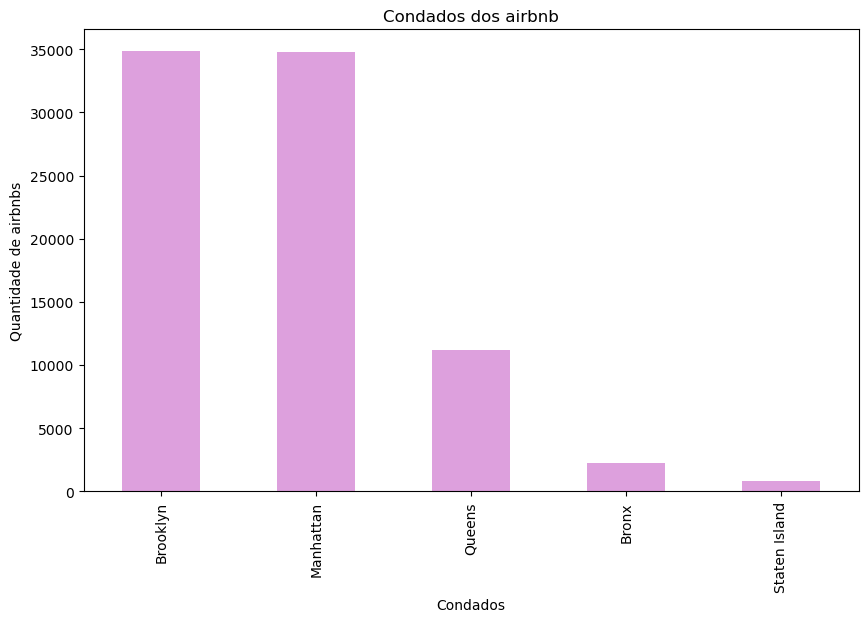

In [81]:
# histograma da localidade e quantidade dos airbnb - ´por quantidade e condados

top_condados = df["Condados"].value_counts()

# Plotting a bar chart
plt.figure(figsize=(10, 6))
top_condados.plot(kind='bar', color='plum')
plt.title('Condados dos airbnb')
plt.xlabel('Condados')
plt.ylabel('Quantidade de airbnbs')
plt.show()

In [82]:
# olhando as 6 bairros com mais airbnbs
df["Bairros"].value_counts().head(5)

Bairros
Bedford-Stuyvesant    6791
Williamsburg          6365
Harlem                4577
Bushwick              4011
Hell's Kitchen        3202
Name: count, dtype: int64

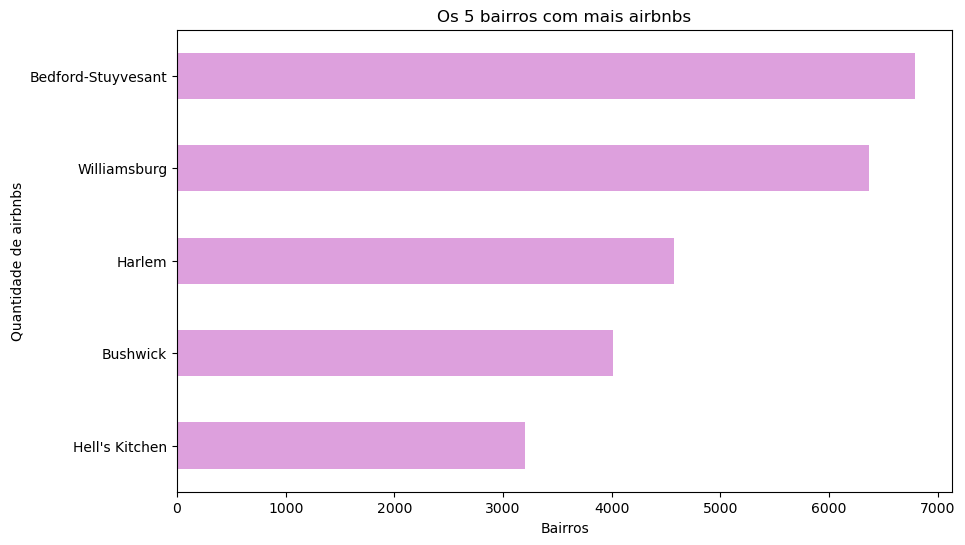

In [83]:
# top 6 bairros com mais airbnbs

top_bairros = df["Bairros"].value_counts().head(5)
top_bairros = top_bairros.sort_values(ascending=True)

# Plotting a bar chart
plt.figure(figsize=(10, 6))
top_bairros.plot(kind='barh', color='plum')
plt.title('Os 5 bairros com mais airbnbs')
plt.xlabel('Bairros')
plt.ylabel('Quantidade de airbnbs')
plt.show()

In [84]:
#  Mapa dos airbnbs separado por condados 
fig = px.scatter_mapbox(df, lat='lat', lon='long', color='Condados',
                        hover_name='NAME', hover_data=['price', 'number_of_reviews'],
                        zoom=10)

fig.update_layout(mapbox_style="carto-positron",
                  mapbox=dict(center=dict(lat=40.7128, lon=-74.0060), 
                              zoom=9),
                  height=600,  
                  width=1000   
                  )

fig.show()

Estatisticas

In [85]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 83878 entries, 0 to 102597
Data columns (total 24 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   id                              83878 non-null  int64  
 1   NAME                            83878 non-null  object 
 2   host_id                         83878 non-null  int64  
 3   host_identity_verified          83878 non-null  object 
 4   host_name                       83878 non-null  object 
 5   Condados                        83878 non-null  object 
 6   Bairros                         83878 non-null  object 
 7   lat                             83878 non-null  float64
 8   long                            83878 non-null  float64
 9   country                         83878 non-null  object 
 10  country_code                    83878 non-null  object 
 11  instant_bookable                83878 non-null  object 
 12  cancellation_policy             8387

In [86]:
# trocando o nome de algumas colunas para melhor entedimento da analise
df = df.rename(columns={
    "price": "Preços",
    "service_fee": "Taxa_de_Serviço",
    "review_rate_number": "Avaliaçao"
})

df[["Preços","Taxa_de_Serviço", "Avaliaçao"]].head()

,Preços,Taxa_de_Serviço,Avaliaçao
0,966.0,193.0,4.0
1,142.0,28.0,4.0
4,204.0,41.0,3.0
5,577.0,115.0,3.0
7,1060.0,212.0,5.0


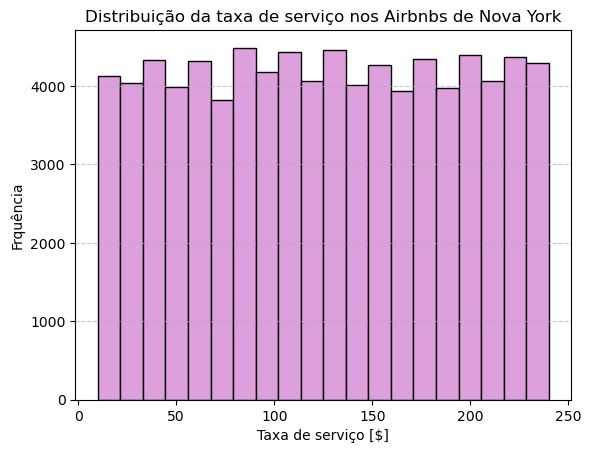

In [87]:
# Histogram and observe the data distribution  
plt.hist(df["Taxa_de_Serviço"], bins=20, color='plum', edgecolor='black')
plt.xlabel("Taxa de serviço [$]")
plt.ylabel("Frquência")
plt.title("Distribuição da taxa de serviço nos Airbnbs de Nova York")
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

In [90]:
#  Distribuiçao de preço por condado

fig = px.box(df, x="Condados", y="Preços")
fig.update_traces(quartilemethod="exclusive") 
fig.update_layout(
    title="Distribuição de preço por condado",
    xaxis_title="Condado",
    yaxis_title="Preços"
    )

fig.show()

Insights    

In [91]:
# media de preço por condado
media_preco_por_condado = df.groupby("Condados")["Preços"].mean().sort_values(ascending = False).round(2)

media_preco_por_condado

Condados
Queens           630.45
Bronx            630.26
Brooklyn         627.50
Manhattan        623.25
Staten Island    622.73
Name: Preços, dtype: float64

In [92]:
# media de preço dos 10 bairros mais caros

media_preco_bairro = df.groupby("Bairros")["Preços"].mean().sort_values(ascending = False).round(2)

media_preco_bairro.head(10)

Bairros
New Dorp                  1048.00
Chelsea, Staten Island    1042.00
Little Neck                906.33
New Dorp Beach             856.71
Riverdale                  822.42
Arden Heights              804.89
Jamaica Hills              800.25
Midland Beach              792.67
East Morrisania            786.95
Mill Basin                 775.14
Name: Preços, dtype: float64

In [93]:
# media de avaliaçao por bairro
media_reviews_bairro = df.groupby("Bairros")["Avaliaçao"].mean().sort_values(ascending = False).round(2)

# os 10 bairros com a melhor média de avaliaçao
media_reviews_bairro.head(10)

Bairros
Glen Oaks          4.50
Bull's Head        4.50
Co-op City         4.40
Little Neck        4.33
Gerritsen Beach    4.33
Huguenot           4.11
Randall Manor      4.03
West Farms         4.00
Todt Hill          4.00
New Dorp           4.00
Name: Avaliaçao, dtype: float64

In [52]:
# os 10 bairros com a pior media de avaliaçao
media_reviews_bairro.tail(10)

neighbourhood
Castle Hill               2.75
Graniteville              2.71
Jamaica Hills             2.70
Lighthouse Hill           2.67
Tottenville               2.60
Manhattan Beach           2.45
Willowbrook               2.00
Chelsea, Staten Island    2.00
Woodrow                   2.00
Howland Hook              1.67
Name: review_rate_number, dtype: float64

In [95]:
# correlacionando media de valor de avaliaçao por bairro, do mais caro ao menos 
media_preco_review_bairros = df.groupby("Bairros").agg({
    "Preços": "mean",
    "Avaliaçao": "mean"
}).sort_values(by="Preços", ascending=False).round(1)
media_preco_review_bairros.head(10)

,Preços,Avaliaçao
Bairros,,
New Dorp,1048.0,4.0
"Chelsea, Staten Island",1042.0,2.0
Little Neck,906.3,4.3
New Dorp Beach,856.7,3.9
Riverdale,822.4,2.9
Arden Heights,804.9,3.8
Jamaica Hills,800.2,2.7
Midland Beach,792.7,3.4
East Morrisania,787.0,3.2


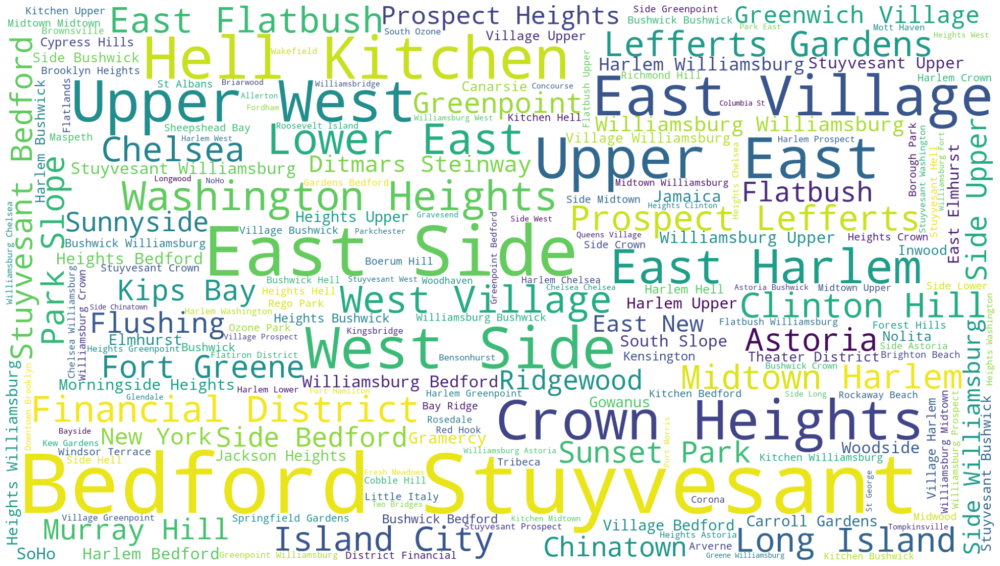

In [97]:
# nuvem de palavras da base de dados
plt.subplots(figsize=(25,15))
wordcloud = WordCloud(
                          background_color='white',
                          width=1920,
                          height=1080
                         ).generate(" ".join(df.Bairros))
plt.imshow(wordcloud)
plt.axis('off')
plt.savefig('neighbourhood.png')
plt.show()